In [1]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import sys
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
import seaborn as sns



def get_windows(job,n_neighbors):
    '''
    For each region and each individual cell in dataset, return the indices of the nearest neighbors.
    
    'job:  meta data containing the start time,index of region, region name, indices of region in original dataframe
    n_neighbors:  the number of neighbors to find for each cell
    '''
    start_time,idx,tissue_name,indices = job
    job_start = time.time()
    
    print ("Starting:", str(idx+1)+'/'+str(len(exps)),': ' + exps[idx])

    tissue = tissue_group.get_group(tissue_name)
    to_fit = tissue.loc[indices][[X,Y]].values

#     fit = NearestNeighbors(n_neighbors=n_neighbors+1).fit(tissue[[X,Y]].values)
    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[[X,Y]].values)
    m = fit.kneighbors(to_fit)
#     m = m[0][:,1:], m[1][:,1:]
    m = m[0], m[1]
    

    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    sorted_indices = m[1].flatten()[args+add[:,None]]

    neighbors = tissue.index.values[sorted_indices]
   
    end_time = time.time()
   
    print ("Finishing:", str(idx+1)+"/"+str(len(exps)),": "+ exps[idx],end_time-job_start,end_time-start_time)
    return neighbors.astype(np.int32)


### ------------------------

### Fill In:
    -ks = individual window sizes to collect.  
        -This accelerates the process of trying different window sizes by collecting them all in one step.
    -path_to_data:  file path for csv file with x,y cluster information
    -X:  column to use for X location
    -Y:  column to use for Y location
    -reg:  column to use for region (should be different for every tissue)
    -file_type('csv','pickle'):  file type
    -cluster_col : column name of cell type cluster to be used for neighborhoods
    -cellhierpath:  path to cellhier libary (should only have to set once per computer
    -keep_cols:  columns to transfer from original dataframe to dataframe with windows and neighborhoods

In [2]:
ks = [5,10,50,100] # k=5 means it collects 5 nearest neighbors for each center cell
path_to_data = '/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas/Combined_Analysis/Seurat/ReferenceMap_AML_Step6/For_Neighborhoods/AML_only_combined_annotated_ForNeighborhoods_112023_blast_separated_DxOnly.csv'
X = 'x.coord'
Y = 'y.coord_rev'
reg = 'orig.ident'
file_type = 'csv'

cluster_col = 'classified_cluster_anno_l2_separate'
keep_cols = [X,Y,reg,cluster_col]
save_path = '/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas/Combined_Analysis/Seurat/ReferenceMap_AML_Step6/NeighborhoodsOutput/'


### ------------------------

In [3]:
#read in data and do some quick data rearrangement
n_neighbors = max(ks)
assert (file_type=='csv' or file_type =='pickle') #


if file_type == 'pickle':
    cells = pd.read_pickle(path_to_data)
if file_type == 'csv':
    cells = pd.read_csv(path_to_data)

cells = pd.concat([cells,pd.get_dummies(cells[cluster_col])],1)


#cells = cells.reset_index() #Uncomment this line if you do any subsetting of dataframe such as removing dirt etc or will throw error at end of next next code block (cell 6)

sum_cols = cells[cluster_col].unique()
values = cells[sum_cols].values

/tmp/ipykernel_661409/1593009386.py:11: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  cells = pd.concat([cells,pd.get_dummies(cells[cluster_col])],1)


In [4]:
#find windows for each cell in each tissue region
tissue_group = cells[[X,Y,reg]].groupby(reg)
exps = list(cells[reg].unique())
tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)] 
tissues = [get_windows(job,n_neighbors) for job in tissue_chunks]


Starting: 2/3 : SB67_NBM44_AML2_191_CODEX_Mesmer
Finishing: 2/3 : SB67_NBM44_AML2_191_CODEX_Mesmer 0.2420823574066162 0.24228596687316895
Starting: 1/3 : SB67_NBM51_AML1_183_CODEX_Mesmer
Finishing: 1/3 : SB67_NBM51_AML1_183_CODEX_Mesmer 0.03336787223815918 0.2767629623413086
Starting: 3/3 : SB67_NBM52_AML3_1329_CODEX_Mesmer
Finishing: 3/3 : SB67_NBM52_AML3_1329_CODEX_Mesmer 0.12475323677062988 0.40168309211730957


In [5]:
#for each cell and its nearest neighbors, reshape and count the number of each cell type in those neighbors.
out_dict = {}
for k in ks:
    for neighbors,job in zip(tissues,tissue_chunks):

        chunk = np.arange(len(neighbors))#indices
        tissue_name = job[2]
        indices = job[3]
        window = values[neighbors[chunk,:k].flatten()].reshape(len(chunk),k,len(sum_cols)).sum(axis = 1)
        out_dict[(tissue_name,k)] = (window.astype(np.float16),indices)

#concatenate the summed windows and combine into one dataframe for each window size tested.
windows = {}
for k in ks:
   
    window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
    window = window.loc[cells.index.values]
    window = pd.concat([cells[keep_cols],window],1)
    windows[k] = window


/tmp/ipykernel_661409/2968920925.py:16: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/tmp/ipykernel_661409/2968920925.py:18: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/tmp/ipykernel_661409/2968920925.py:16: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/tmp/ipykernel_661409/2968920925.py:18: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[

### ------------------------

### Fill In:
    -k:  window_size (needs to be in ks (saved above))
    -n_neighborhoods:  number of neighborhoods to find

In [6]:
# 1 Follicular (Crohn's Like)
# 2 Diffuse

In [7]:
k = 10
n_neighborhoods = 15
neighborhood_name = "neighborhood"+str(k)
k_centroids = {}

In [8]:
windows2 = windows[10]
# windows2[cluster_col] = cells[cluster_col]

km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)

labelskm = km.fit_predict(windows2[sum_cols].values)
k_centroids[k] = km.cluster_centers_
cells['neighborhood10'] = labelskm
cells[neighborhood_name] = cells[neighborhood_name].astype('category')
#['reg064_A','reg066_A','reg018_B','reg023_A']


/home/bandyopads/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


In [9]:
cell_order = ["AEC","B-Cell", "CD10+ HSPC", "CD4+ T-Cell", 
             "CD8+ T-Cell", "Dendritic Cells", "Early Myeloid Progenitor", "Endothelial","Erythroblast",
             "Erythroid", "GMP", "HSPC", "Immature_B_Cell", "Macrophage",
             "MastCells", "Mature Myeloid", "Megakaryocyte", "Monocyte","MSC",
             "Myeloid Progenitor", "Plasma Cell", "Schwann Cells", "SEC", "SPINK2+ HSPC", "Stromal",
             "VSMC"]    

cell_order = ["Dx NPM1 Mutant Blast","SPINK2+ HSPC", "HSPC", "GMP","GMP/Myeloblast","Early Myeloid Progenitor", "Intermediate Myeloid", "Mature Myeloid",
             "pDC", "Monocytes","Non-Classical Monocyte","Macrophages", "Erythroblast", "Erythroid", "CD34+ CD61+", "GATA1neg_Mks", "GATA1pos_Mks",
             "CLP","Immature_B_Cell", "B-Cells","Plasma Cells", "CD4+ T-Cell", "CD8+ T-Cell", "SEC", "AEC","VSMC", "MSC", "THY1+ MSC", "Endosteal", "Adipocyte"]




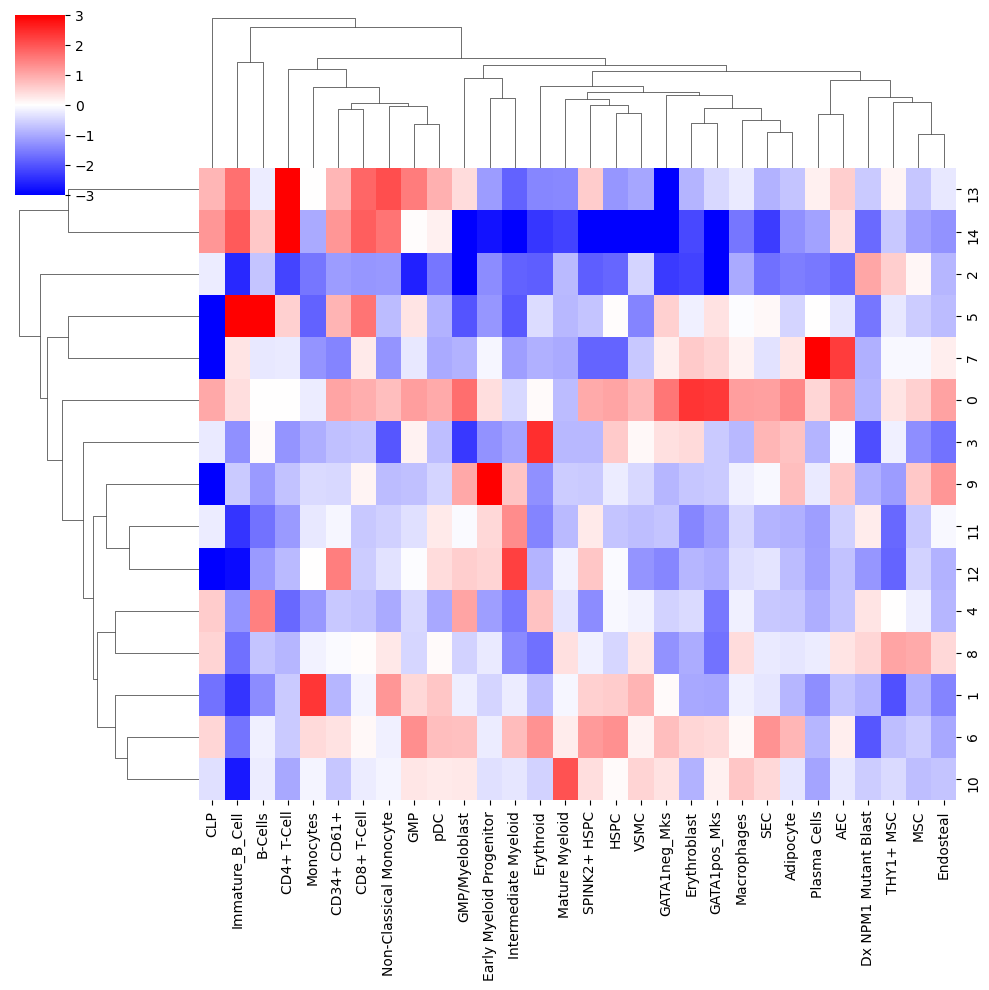

In [10]:
# this plot shows the types of cells (ClusterIDs) in the different niches (0-7)
k_to_plot = 10
niche_clusters = (k_centroids[k_to_plot])
tissue_avgs = values.mean(axis = 0)
fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
fc = pd.DataFrame(fc,columns = sum_cols)
s=sns.clustermap(fc.loc[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = True)
# s=sns.clustermap(fc.loc[[0,1,2,3,4],cell_order], vmin =-3,vmax = 3,cmap = 'bwr',row_cluster = False)
# s.savefig("raw_figs/celltypes_perniche_10.pdf")


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas_Analysis/NeighborhoodsLabeled_spatial_coords.png'

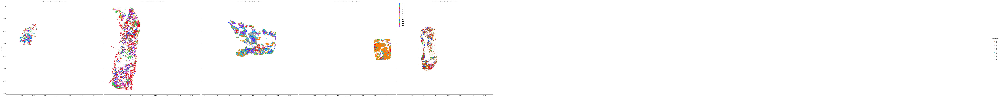

In [11]:
cells['neighborhood10'] = cells['neighborhood10'].astype('category')
sns.lmplot(data = cells[cells['Region']=="reg001"],x = 'x.coord',y='y.coord_rev',scatter_kws={"s": 1}, hue = 'neighborhood10',palette = 'bright',height = 15,col = reg,col_wrap = 10,fit_reg = False, legend = "full")
# title
plt.legend(loc='upper left', prop={'size': 15}, markerscale=15)
plt.savefig("/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas_Analysis/NeighborhoodsLabeled_spatial_coords.png",dpi = 300)
cells.to_csv("/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas_Analysis/SB67_H10_H14_H32_neighborhood.csv")


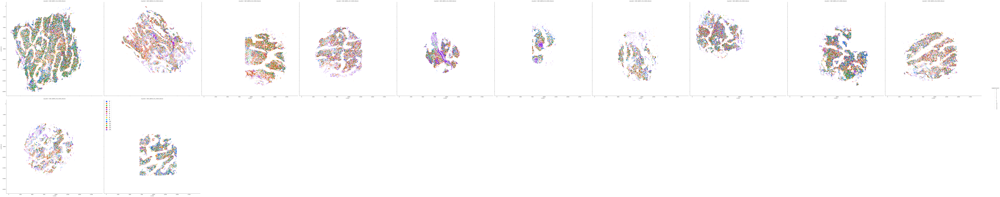

In [36]:
cells['neighborhood10'] = cells['neighborhood10'].astype('category')
sns.lmplot(data = cells[cells['Region']=="reg001"],x = 'x.coord',y='y.coord_rev',scatter_kws={"s": 1}, hue = 'neighborhood10',palette = 'bright',height = 15,col = reg,col_wrap = 10,fit_reg = False, legend = "full")
# title
plt.legend(loc='upper left', prop={'size': 15}, markerscale=15)


In [21]:
cells.to_csv("/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas/Combined_Analysis/Seurat/ReferenceMap_AML_Step6/NeighborhoodsOutput/AML_only_combined.neighborhood_blasts_separated_DxOnly.csv")
fc.to_csv("/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas/Combined_Analysis/Seurat/ReferenceMap_AML_Step6/NeighborhoodsOutput/AML_only.combined_neighborhood_fc_blasts_separated_DxOnly.csv")

In [18]:
cells

,Unnamed: 0,orig.ident,nCount_CODEX,nFeature_CODEX,CellID,Size,x.coord,y.coord,CODEX_snn_res.1.5,seurat_clusters,...,MkP,Monocyte,Myeloid Progenitor,Plasma Cell,SEC,SPINK2+ HSPC,Stromal,VSMC,neighborhood12,neighborhood10
0,1_1,SB67_NBM27_H10_CODEX_Mesmer,439.691057,49,2.0,123,13004.252033,104.243902,9,14,...,0,0,1,0,0,0,0,0,9,9
1,2_1,SB67_NBM27_H10_CODEX_Mesmer,621.033058,49,4.0,121,12980.925620,136.413223,9,14,...,0,0,1,0,0,0,0,0,9,9
2,3_1,SB67_NBM27_H10_CODEX_Mesmer,753.661972,49,5.0,71,12935.408451,153.746479,17,12,...,0,0,0,0,0,0,0,0,9,9
3,4_1,SB67_NBM27_H10_CODEX_Mesmer,500.769231,49,7.0,65,12875.461538,170.600000,22,14,...,0,0,1,0,0,0,0,0,8,8
4,5_1,SB67_NBM27_H10_CODEX_Mesmer,518.670588,49,8.0,170,12922.470588,173.664706,24,14,...,0,0,1,0,0,0,0,0,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352652,33519_3,SB67_NBM31_H32_CODEX_Mesmer,658.762572,49,42744.0,2426,10135.603050,14621.714757,12,17,...,0,0,0,0,0,0,0,0,10,12
352653,33520_3,SB67_NBM31_H32_CODEX_Mesmer,483.066800,49,42751.0,2006,7025.304586,14713.905284,4,17,...,0,0,0,0,0,0,0,0,10,10
352654,33522_3,SB67_NBM31_H32_CODEX_Mesmer,581.620000,47,42775.0,100,10707.960000,15546.100000,9,7,...,0,0,0,0,0,0,0,0,10,12
352655,33523_3,SB67_NBM31_H32_CODEX_Mesmer,626.006116,48,42784.0,327,9529.159021,16396.556575,5,1,...,0,0,0,0,0,0,0,0,10,12


In [25]:
cells_H10 = cells.loc[cells['orig.ident'] == 'SB67_NBM27_H10_CODEX_Mesmer']
cells_H14 = cells.loc[cells['orig.ident'] == 'SB67_NBM28_H14_CODEX_Mesmer']
cells_H32 = cells.loc[cells['orig.ident'] == 'SB67_NBM31_H32_CODEX_Mesmer']
cells_H10.to_csv("/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas_Analysis/SB67_H10_neighborhood.csv")
cells_H14.to_csv("/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas_Analysis/SB67_H14_neighborhood.csv")
cells_H32.to_csv("/mnt/isilon/tan_lab_imaging/Analysis/bandyopads/NBM_CODEX_Atlas_Analysis/SB67_H32_neighborhood.csv")


In [29]:
cells_H14['cluster_anno_l2']

227093            B-Cell
227094           Stromal
227095     Megakaryocyte
227096            B-Cell
227097     Megakaryocyte
               ...      
320922       CD4+ T-Cell
320923        Macrophage
320924    Mature Myeloid
320925    Mature Myeloid
320926    Mature Myeloid
Name: cluster_anno_l2, Length: 93834, dtype: object

In [15]:
cells['neighborhood10'] = cells['neighborhood10'].astype('category')
sns.lmplot(data = cells[cells['Region']==1],x = 'X:X',y='Y:Y',hue = 'neighborhood10',palette = 'bright',height = 8,col = reg,col_wrap = 10,fit_reg = False)


KeyError: "['X:X', 'Y:Y'] not in index"

###### -------------------------------

In [35]:
if 'Sample_Group' in cells.columns:
    print("Column exists")
else:
    print("Column does not exist")
cells.groupby('orig.ident', 'Sample_Group')

Column exists


ValueError: No axis named Sample_Group for object type DataFrame

In [ ]:
#plot for each group and each patient the percent of total cells allocated to each neighborhood
fc = cells.groupby(['orig.ident','Sample_Group']).apply(lambda x: x['neighborhood10'].value_counts(sort = False,normalize = True))

fc.columns = range(15)
melt = pd.melt(fc.reset_index(),id_vars = ['orig.ident','Sample_Group'])
melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})
f,ax = plt.subplots(figsize = (10,5))
sns.stripplot(data = melt, hue = 'Sample_Group',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood')
sns.pointplot(data = melt, scatter_kws  = {'marker': 'd'},hue = 'Sample_Group',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood')

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2], title="Groups",
          handletextpad=0, columnspacing=1,
          loc="upper left", ncol=3, frameon=True)

In [53]:
#t-test to evaluate if any neighborhood is enriched in one group
from scipy.stats import ttest_ind
for i in range(15):
    n2 = melt[melt['neighborhood']==i]
    print (i,'    ',ttest_ind(n2[n2['Sample_Group']=="AML"]['frequency of neighborhood'],n2[n2['Sample_Group']=="NSM"]['frequency of neighborhood']))
    
    
    

0      Ttest_indResult(statistic=0.24476366624785173, pvalue=0.8147953461907183)
1      Ttest_indResult(statistic=2.7736464810265713, pvalue=0.03226662969489905)
2      Ttest_indResult(statistic=-0.06500557696926727, pvalue=0.9502813176346019)
3      Ttest_indResult(statistic=-4.886494923329796, pvalue=0.002748117673521036)
4      Ttest_indResult(statistic=-3.051411208593601, pvalue=0.022471190452684676)
5      Ttest_indResult(statistic=1.6821993824374633, pvalue=0.14352232115734992)
6      Ttest_indResult(statistic=-1.0637430368296057, pvalue=0.3283707649916696)
7      Ttest_indResult(statistic=-6.906382908829598, pvalue=0.00045553431011430864)
8      Ttest_indResult(statistic=1.6651493703173643, pvalue=0.1469365555480529)
9      Ttest_indResult(statistic=0.8962320133082946, pvalue=0.4046500714257932)
10      Ttest_indResult(statistic=-0.41686866853511795, pvalue=0.6912777106234979)
11      Ttest_indResult(statistic=1.0020447454712331, pvalue=0.35500607814407753)
12      Ttest_indResu

/home/graham/anaconda3/envs/hier/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Interpreting tuple 'by' as a list of keys, rather than a single key. Use 'by=[...]' instead of 'by=(...)'. In the future, a tuple will always mean a single key.
  """Entry point for launching an IPython kernel.
/home/graham/anaconda3/envs/hier/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


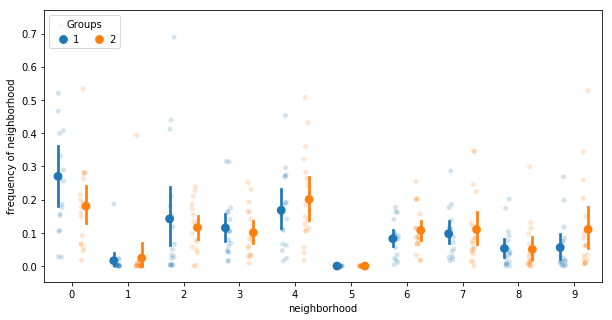

In [21]:
#same as above except neighborhood 5 is removed from analysis.
fc = cells[cells['neighborhood10']!=5].groupby(('patients','groups')).apply(lambda x: x['neighborhood10'].value_counts(sort = False,normalize = True))

fc.columns = range(10)
melt = pd.melt(fc.reset_index(),id_vars = ['patients','groups'])
melt = melt.rename(columns = {'variable':'neighborhood','value':'frequency of neighborhood'})

f,ax = plt.subplots(figsize = (10,5))
sns.stripplot(data = melt, hue = 'groups',dodge = True,alpha = .2,x ='neighborhood', y ='frequency of neighborhood')
sns.pointplot(data = melt, scatter_kws  = {'marker': 'd'},hue = 'groups',dodge = .5,join = False,x ='neighborhood', y ='frequency of neighborhood')

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels[:2], title="Groups",
          handletextpad=0, columnspacing=1,
          loc="upper left", ncol=3, frameon=True)

In [22]:

for i in range(10):
    n2 = melt[melt['neighborhood']==i]
#n2 = n2[n2['Frequency']>.015]
    print (i,'    ',ttest_ind(n2[n2['groups']==1]['frequency of neighborhood'],n2[n2['groups']==2]['frequency of neighborhood']))

0      Ttest_indResult(statistic=1.6853828909412905, pvalue=0.10134988566507021)
1      Ttest_indResult(statistic=-0.32147409458873394, pvalue=0.7498785362794221)
2      Ttest_indResult(statistic=0.5275441438426111, pvalue=0.6013450279082893)
3      Ttest_indResult(statistic=0.5155830114932274, pvalue=0.6095828061732658)
4      Ttest_indResult(statistic=-0.7581734082736765, pvalue=0.4537280209811577)
5      Ttest_indResult(statistic=nan, pvalue=nan)
6      Ttest_indResult(statistic=-1.187712115024388, pvalue=0.2434255209126686)
7      Ttest_indResult(statistic=-0.4113005727248544, pvalue=0.6835111540387997)
8      Ttest_indResult(statistic=0.11831082981011709, pvalue=0.9065386135435074)
9      Ttest_indResult(statistic=-1.4077708963965987, pvalue=0.16854972065274612)
